In [1]:
import warnings
import itertools
import numpy as np
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")
plt.style.use('fivethirtyeight')
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
import fbprophet as prpt
from scipy.stats import boxcox
from scipy.special import inv_boxcox

Importing plotly failed. Interactive plots will not work.


# Analisis de criminalidad en la CDMX

En México la inseguridad es uno de los problemas de mayor relevancia en la actualidad, si bien es ingenuo en pensar que este problema (que tiene tantas razones de ser relacionadas a la cultura e historia del país) puede ser resuelto al mejorar el desempeño de las fuerzas del orden; más ingenuo aún, es pensar que sin la implementación de nuevas ideas y proyectos en distintos ambitos de la sociedad los problemas del país como la inseguridad desaparecerán.


Para este proyecto se escogió la base de datos de “Victimas en carpeta de investigación PGJ”, la cual contienen crímenes reportados en la CDMX desde enero de 2019 hasta los primeros días de marzo 2021 (https://datos.cdmx.gob.mx/dataset/victimas-en-carpetas-de-investigacion-pgj). En el proyecto se realizará un analisis estadístico de los crímenes cometidos con el objetivo de realizar una predicción de los crímenes que se realizarán en cada una de las delegaciones de la CDMX durante el 2021. Adicionalmente se hará un ejercicio de optimización en el que dado un cierto número de patrullas disponibles en cada delegación se encuentra un posicionamiento optimo para estas. 

Nota: Se modificó la base de datos para que tenga un formato analogo a la base de datos que se nos envío por correo ('datalab.csv').


In [2]:
#Leemos la base de datos y la almacenamos en un df
crimes = pd.read_csv('crime_data(2019-2020).csv')

#Convertimos los datos de la columna 'FechaHecho' a 'time objects'
crimes['FechaHecho'] = pd.to_datetime(crimes['FechaHecho'], errors='coerce')
crimes = crimes[crimes['FechaHecho'].notna()]



In [3]:
#Checamos que nuestros datos no contengan na's
crimes.FechaHecho.isna().sum()

0

In [4]:
#Eliminamos crimenes no cometidos en la CDMX
alcs_cdmx = ['ALVARO OBREGON', 'TLALPAN', 'VENUSTIANO CARRANZA', 'CUAJIMALPA DE MORELOS', 'GUSTAVO A MADERO', 'MIGUEL HIDALGO', 'AZCAPOTZALCO', 'BENITO JUAREZ', 'COYOACAN', 'CUAUHTEMOC', 'LA MAGDALENA CONTRERAS', 'IZTAPALAPA', 'IZTACALCO', 'XOCHIMILCO', 'TLAHUAC', 'MILPA ALTA']
crimes = crimes[crimes['AlcaldiaHechos'].isin(alcs_cdmx)]
crimes_aux1 = crimes.copy()


In [5]:
#Checamos las fechas limite.
crimes['FechaHecho'].min(), crimes['FechaHecho'].max()

(Timestamp('1950-02-17 00:00:00'), Timestamp('2020-12-31 00:00:00'))

In [6]:
#Analizamos las columnas para desechar información inutil.
list(crimes.columns.values)

['Columna1',
 'FechaInicio',
 'Delito',
 'Categoria',
 'Sexo',
 'Edad',
 'CalidadJuridica',
 'FechaHecho',
 'HoraHecho',
 'HoraInicio',
 'geopoint',
 'AlcaldiaHechos',
 'ColoniaHechos',
 'persona_fisica']

In [7]:
# Se enlistan las columnas que vamos a desechar, las tiramos y ordenamos for 'FechaHecho'
drop = ['Columna1','FechaInicio', 'Delito', 'Sexo', 'Edad', 'CalidadJuridica', 'HoraHecho', 'HoraInicio', 'geopoint', 'persona_fisica', 'ColoniaHechos']
crimes.drop(drop, axis = 1, inplace = True)
crimes.sort_values('FechaHecho')

,Categoria,FechaHecho,AlcaldiaHechos
212594,DELITO DE BAJO IMPACTO,1950-02-17,CUAUHTEMOC
325843,DELITO DE BAJO IMPACTO,1952-12-23,VENUSTIANO CARRANZA
456835,VIOLACIÓN,1962-02-15,CUAUHTEMOC
39881,ROBO A NEGOCIO CON VIOLENCIA,1963-06-10,AZCAPOTZALCO
322575,DELITO DE BAJO IMPACTO,1963-10-30,AZCAPOTZALCO
...,...,...,...
136649,HECHO NO DELICTIVO,2020-12-31,IZTAPALAPA
340386,ROBO DE VEHÍCULO CON Y SIN VIOLENCIA,2020-12-31,LA MAGDALENA CONTRERAS
388932,DELITO DE BAJO IMPACTO,2020-12-31,BENITO JUAREZ
136615,DELITO DE BAJO IMPACTO,2020-12-31,IZTACALCO


In [8]:
#Fijamos 'FechoHecho' como indice del df
crimes = crimes.set_index('FechaHecho')
print(crimes)

                         Categoria       AlcaldiaHechos
FechaHecho                                             
2020-01-03  DELITO DE BAJO IMPACTO        BENITO JUAREZ
2016-03-04  DELITO DE BAJO IMPACTO  VENUSTIANO CARRANZA
2020-02-03  DELITO DE BAJO IMPACTO             COYOACAN
2018-12-31  DELITO DE BAJO IMPACTO           CUAUHTEMOC
2020-02-03  DELITO DE BAJO IMPACTO        BENITO JUAREZ
...                            ...                  ...
2020-07-21  DELITO DE BAJO IMPACTO       MIGUEL HIDALGO
2020-07-21  DELITO DE BAJO IMPACTO     GUSTAVO A MADERO
2020-07-17  DELITO DE BAJO IMPACTO       MIGUEL HIDALGO
2020-07-21  DELITO DE BAJO IMPACTO        BENITO JUAREZ
2020-10-07      HECHO NO DELICTIVO           CUAUHTEMOC

[473409 rows x 2 columns]


Ahora haremos una exploración general de los datos.

In [9]:
crimes.index.min(), crimes.index.max()


(Timestamp('1950-02-17 00:00:00'), Timestamp('2020-12-31 00:00:00'))

In [10]:
crimes.shape

(473409, 2)

In [11]:
crime_types = list(crimes.Categoria.unique())


In [12]:
crime_types

['DELITO DE BAJO IMPACTO',
 'ROBO A TRANSEUNTE EN VÍA PÚBLICA CON Y SIN VIOLENCIA',
 'ROBO A NEGOCIO CON VIOLENCIA',
 'ROBO A REPARTIDOR CON Y SIN VIOLENCIA',
 'HECHO NO DELICTIVO',
 'ROBO DE VEHÍCULO CON Y SIN VIOLENCIA',
 'ROBO A PASAJERO A BORDO DEL METRO CON Y SIN VIOLENCIA',
 'HOMICIDIO DOLOSO',
 'VIOLACIÓN',
 'ROBO A CASA HABITACIÓN CON VIOLENCIA',
 'ROBO A CUENTAHABIENTE SALIENDO DEL CAJERO CON VIOLENCIA',
 'ROBO A PASAJERO A BORDO DE MICROBUS CON Y SIN VIOLENCIA',
 'LESIONES DOLOSAS POR DISPARO DE ARMA DE FUEGO',
 'ROBO A PASAJERO A BORDO DE TAXI CON VIOLENCIA',
 'ROBO A TRANSPORTISTA CON Y SIN VIOLENCIA',
 'SECUESTRO']

In [13]:
#Lista de crimenes de alto impacto.
hi_crime_list = ['ROBO DE VEHÍCULO CON Y SIN VIOLENCIA',
 'ROBO A PASAJERO A BORDO DE MICROBUS CON Y SIN VIOLENCIA',
 'ROBO A TRANSEUNTE EN VÍA PÚBLICA CON Y SIN VIOLENCIA',
 'ROBO A PASAJERO A BORDO DEL METRO CON Y SIN VIOLENCIA',
 'ROBO A CUENTAHABIENTE SALIENDO DEL CAJERO CON VIOLENCIA',
 'VIOLACIÓN',
 'ROBO A REPARTIDOR CON Y SIN VIOLENCIA',
 'HOMICIDIO DOLOSO',
 'ROBO A NEGOCIO CON VIOLENCIA',
 'LESIONES DOLOSAS POR DISPARO DE ARMA DE FUEGO',
 'ROBO A PASAJERO A BORDO DE TAXI CON VIOLENCIA',
 'ROBO A CASA HABITACIÓN CON VIOLENCIA',
 'SECUESTRO',
 'ROBO A TRANSPORTISTA CON Y SIN VIOLENCIA']

Se explora la distribución de los crimenes con respecto al tiempo.

<AxesSubplot:title={'center':'Frecuencia de crimenes'}, xlabel='FechaHecho'>

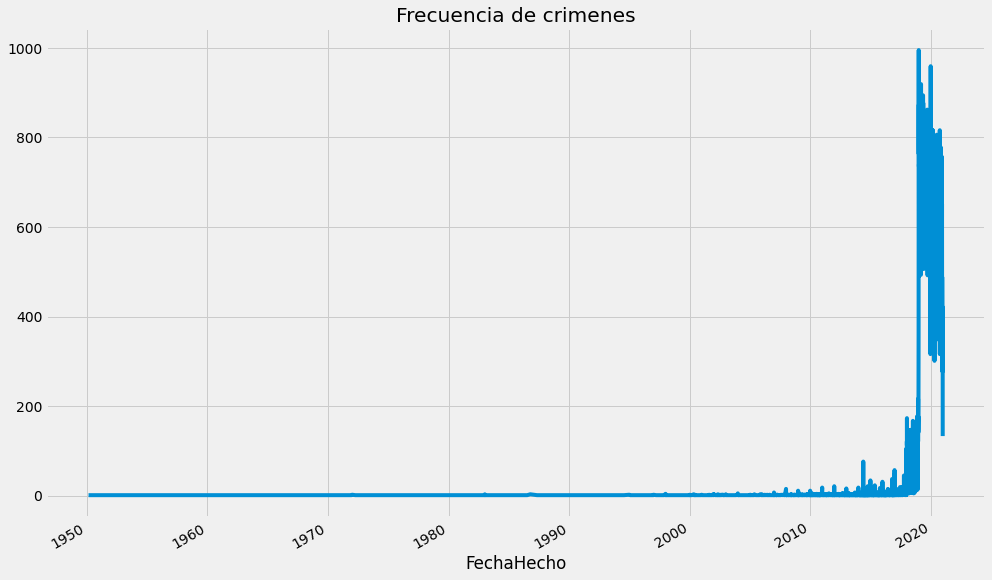

In [14]:
#Agrupamos por fecha hecho y contamos registros en cada fecha.
exploration = crimes.groupby('FechaHecho').Categoria.count()

#Gráficamos la cuenta de crimenes contra el tiempo.
exploration.plot(figsize=(15,10), title = 'Frecuencia de crimenes')

<AxesSubplot:title={'center':'Frecuencia de crimenes'}, xlabel='FechaHecho'>

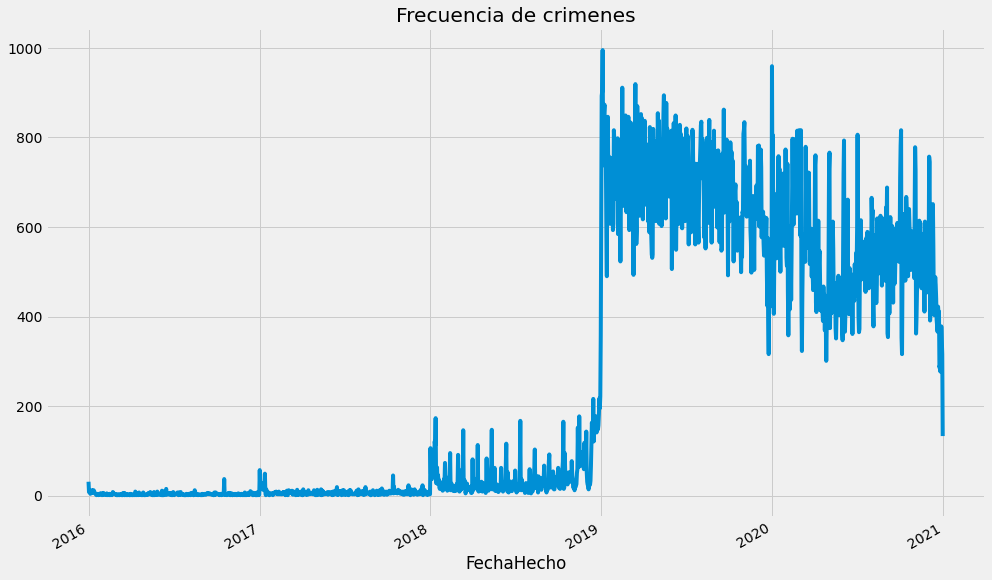

In [15]:
#Desechamos los crimenes anteriores al 2016.
exploration = exploration[exploration.index > '2015-12-31']

#Graficamos
exploration.plot(figsize=(15,10), title = 'Frecuencia de crimenes')

Se puede observar que hay información significativa del año 2018 que no fue registrada hasta 2019. Sería conveniente realizar una predicción de los crimenes del 2021 que no serán reportados hasta el 2022 y de esta manera tener un modelo un poco más preciso, sin embargo de momento los ignoraremos. La información de los crimenes cometidos antes del 2019 se desecha.

In [16]:
#Filtramos los crimenes cometidos antes del 2019
crimes = crimes[crimes.index > '2018-12-31']

In [17]:
#Creamos df con crimenes de bajo impacto.
li_crimes_ind = crimes['Categoria'].values == 'DELITO DE BAJO IMPACTO'
li_crimes = crimes.loc[li_crimes_ind]

#Creamos df con crimenes de alto impacto.
hi_crimes = crimes[crimes.Categoria.isin(hi_crime_list)]

#Tiramos columna redundante.
li_crimes.drop('Categoria', axis = 1, inplace= True)
hi_crimes.drop('Categoria', axis = 1, inplace= True)


A continuación separaremos los datos por delegaciones y aplicaremos al conteo de registros la transformación 'Box-Cox', esta transformación altera los datos de manera que sean más parecidos a una distribución normal. De esta manera se espera obtener predicciones más acertadas. 
La función 'Box-Cox' utliza un parametro lambda, la función de Scipy 'boxcox(x)' nos devuelve el valor de lambda óptimo (máxima verosimilitud).

Además separaremos nuestro conjunto de datos para tener un conjunto de entrenamiento y otro de prueba. Con un radio 3:1.

In [18]:

def prepare_explore_data(crime_data):
    """
    input: df con datos de crimenes.
    output: (diccionario con frecuencias de crimenes transformadas, diccionario con valores lam (lambda) de las transformaciones).
    
    La función delegación plot toma un cantidad de crimenes cometidos diariamente, los separa por alcaldías y genera un plot. Se      almacenan el número máximo de crimenes realizados en cada delegación (caps). Luego se transforman mediante la función             'Boxcox'. Posteriormente dividimos el conjunto de datos en uno de entrenamiento y uno de prueba, y se almacenan en sus            respectivos diccionarios. El valor lam (lambda) de la transformación también es almacenado en un diccionario pues será            necesario para luego invertir la transformación. Finalmente se cambia el formato del df para prepararlo para el Prophet de        fbprophet.
    """
    #Creamos diccionarios
    crimes_train = {}
    crimes_test = {}
    lam = {}
    caps = {}
    
    #Loop para cada alcaldía
    for alc in alcs_cdmx:
        
        #Frecuencia de crimenes en alcaldía
        aux = crime_data[crime_data['AlcaldiaHechos']==alc].groupby('FechaHecho').count()
        
        #Plot
        aux.plot(figsize=(18,2), legend =True, title = '{}'.format(alc))
        
        #Renombramos columnas para que el Prophet pueda utilizarlo.
        aux = aux.rename(columns={'AlcaldiaHechos':'y'})
        aux.index.names = ['ds']
        aux= aux.reset_index()
        
        #Creamos subconjuntos de entrenamiento y prueba. (3:1)
        crimes_train[alc] = aux[aux['ds'] < '2020-07-01']
        crimes_test[alc] = aux[aux['ds'] > '2020-06-30']

        #Almacenamos los caps.
        caps[alc] = max(crimes_train[alc]['y'])

        #Transformación boxcox
        crimes_train[alc]['y'], lam[alc] = boxcox(crimes_train[alc]['y'])
        
        
        
        
        
        

    return crimes_train, crimes_test, lam, caps





Para medir el desempeño de nuestros modelos es necesario definir una métrica objetiva. En este caso se decidió utilizar el 'error porcentual absoluto medio' (MAPE). 

In [19]:
def mape(forecast, crimes_test):
    '''
    input: Predicción fbprophet.
    output: error porcentual absoluto medio (MAPE).

    Esta función calcula el MAPE unicamente sobre el subconjunto de prueba.
    '''
    aux = forecast[forecast['ds']> '2020-06-30']
    return np.mean(abs(np.divide((aux.loc[:,'yhat']-crimes_test['y']),crimes_test['y'])))



Ya que tenemos los datos preparados para generar nuestras predicciones, utilizaremos la librería fbprophet para generar los modelos que se ajusten a nuestros datos.

Fbprophet genera modelos robustos y muy ajustable a las particularidades de los diferentes conjuntos de datos. Por ejemplo en este caso tenemos le indicamos al Prophet que hay ciclos semanales y anuales. Además definimos un crecimiento logístico.

Nuestras predicciones serán generadas para el segundo semestre del año 2020 y evaluadas con los datos históricos de ese mismo periodo.

In [20]:

def generate_model(crime_data):
    """
    input:  df con datos de crimenes.
    output: diccionario con df's con las predicciones de crimenes por día por delegación, diccionario con valores del MAPE por                delegación.
    
    Se exploran y preparan los datos con la función prepare_explore data, luego se genera un modelo para cada delegación,            posteriormente se almacenan y grafican los datos.

    """
    #Preparamos datos y pausamos para generar plots.
    print("Número de crimenes al día por delegación: ")
    crimes_train, crimes_test, lam, caps = prepare_explore_data(crime_data)
    plt.pause(0.05)

    #Diccionario de predicciones.
    prediction = {}

    #Diccionario de MAPE's
    mapes = {}

    #Loop de alcaldías
    for alc in alcs_cdmx:
        
        #Instanciamos el modelo prophet.
        model1 = prpt.Prophet(interval_width=0.8, weekly_seasonality= True, yearly_seasonality=True, growth = 'logistic')
        
        #Definimos el cap del modelo logístico.
        cap = caps[alc]*1.6
        crimes_train[alc]['cap'] = cap

        #Ajustamos el modelo a los datos.
        model1.fit(crimes_train[alc])

        #Hacemos una df del segundo semestre del 2020 (184 días).
        future = model1.make_future_dataframe(periods=184)
        
        #Definimos el cap de la predicción (igual al cap del modelo).
        future['cap'] = cap

        #Creamos la predicción y se almacena en el df 'future'.
        forecast= model1.predict(future)

        #Invertimos transformación 'boxcox'
        model1.history['y'] = crimes_train[alc]['y'].apply(lambda x: inv_boxcox(x, lam[alc]))
        forecast[['yhat','yhat_upper','yhat_lower']] = forecast[['yhat','yhat_upper','yhat_lower']].apply(lambda x: inv_boxcox(x, lam[alc]))
            
        #Imprimimos plots y errores.
        print("\n\n\n\nPredicciones para la delegación {}".format(alc))
        model1.plot(forecast);
        error = mape(forecast, crimes_test[alc])
        print("MAPE: {}".format(error))
        
        #Pausamos para que generen los plots
        plt.pause(0.05)
        
        #Almacenamos datos.
        prediction[alc] = forecast
        mapes[alc] = error
    return prediction, mapes
        


### Crimenes de bajo impacto.

Número de crimenes al día por delegación: 


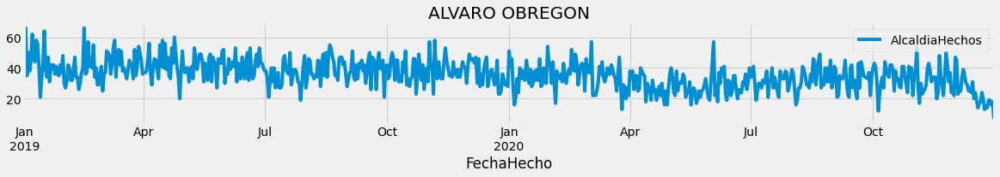

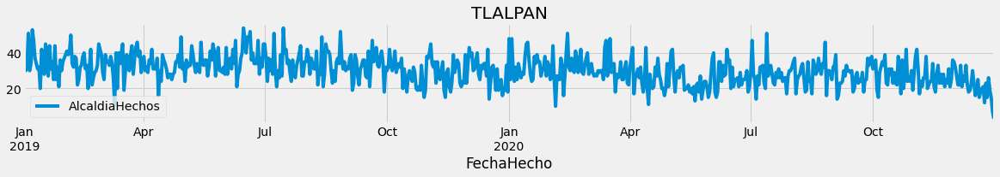

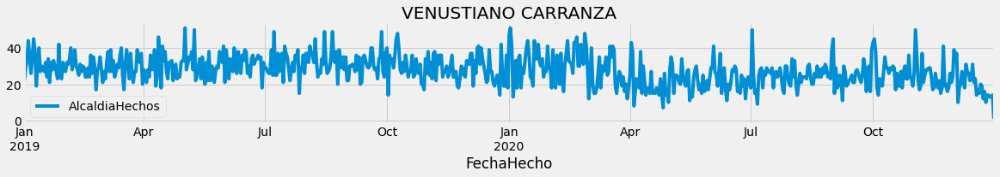

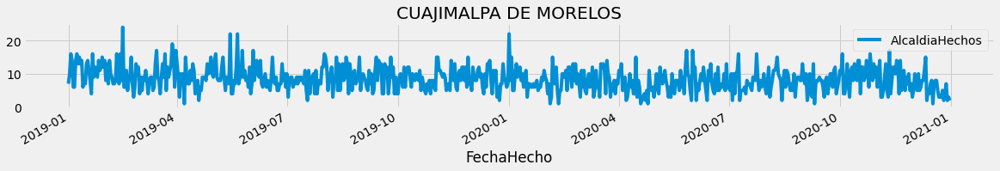

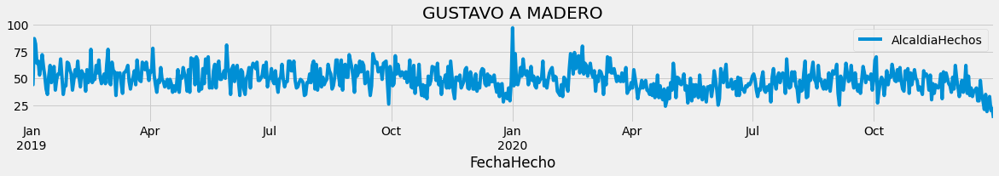

...

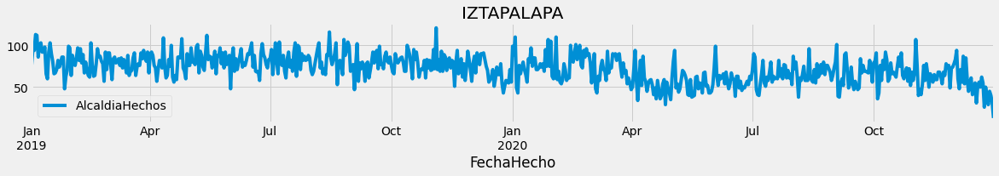

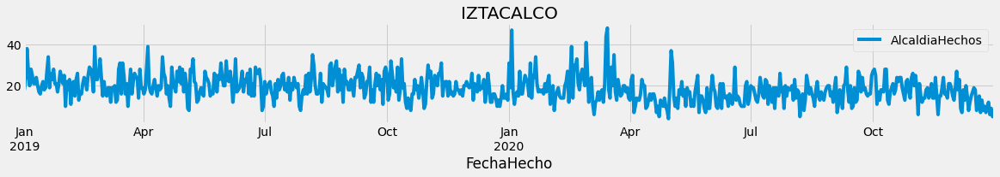

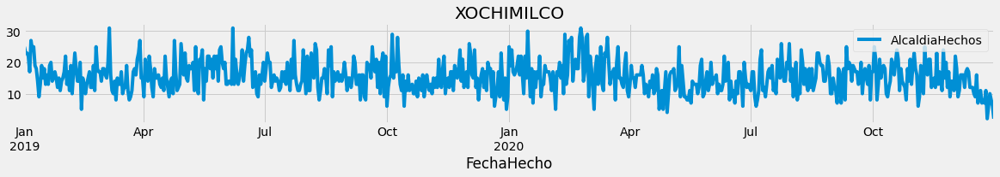

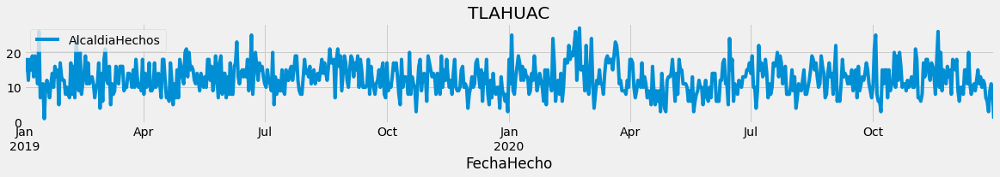

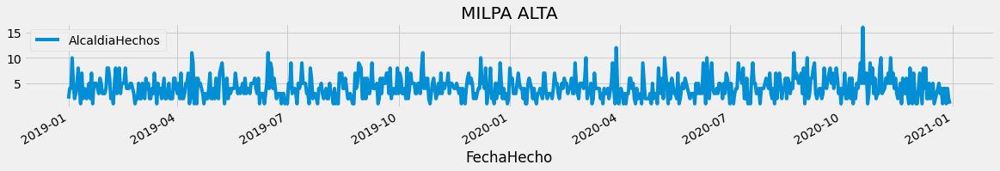

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación ALVARO OBREGON
MAPE: 0.24535166751753418


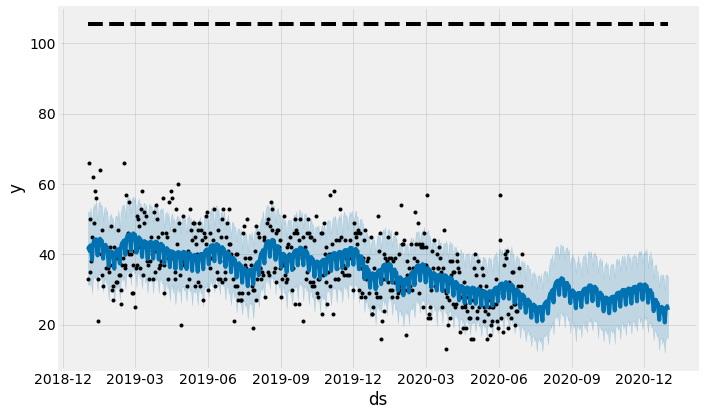

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación TLALPAN
MAPE: 0.24435383034124933


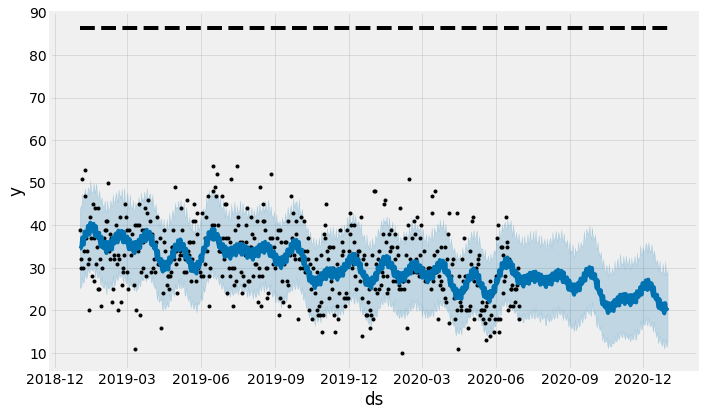

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación VENUSTIANO CARRANZA
MAPE: 0.36951714760268894


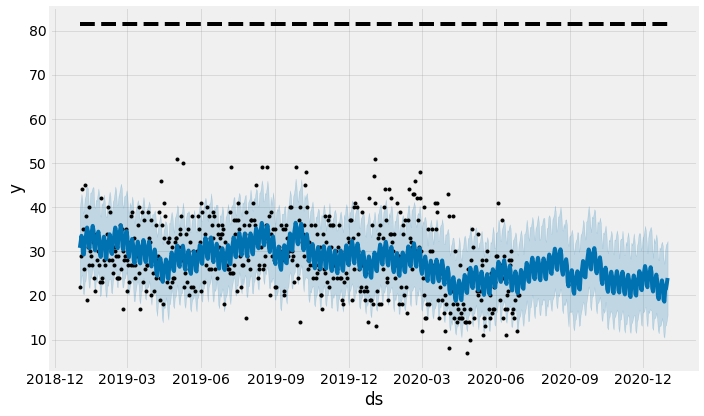

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación CUAJIMALPA DE MORELOS
MAPE: 0.5416419026764538


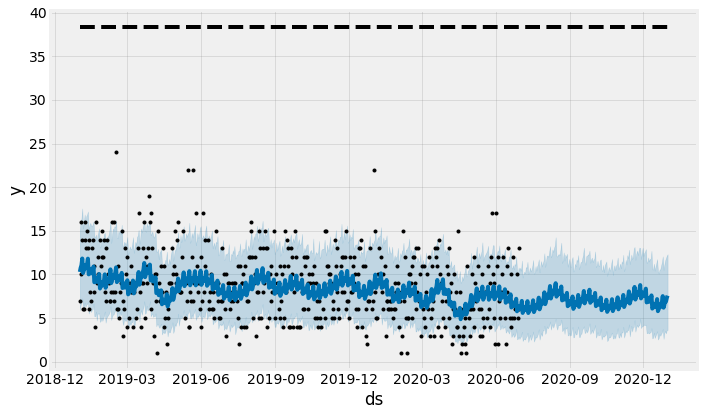

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación GUSTAVO A MADERO
MAPE: 0.19404249714894928


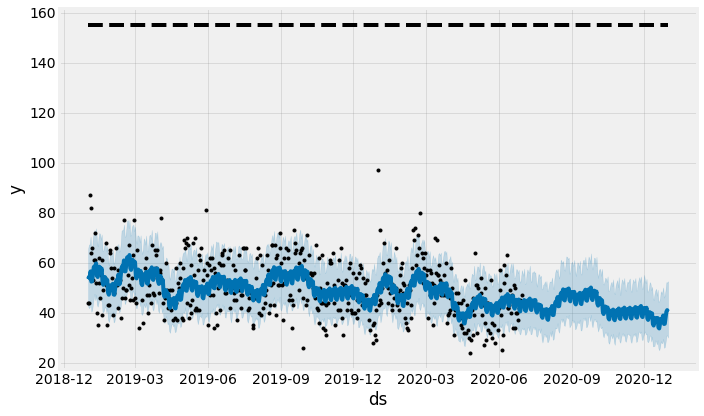

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación MIGUEL HIDALGO
MAPE: 0.2674398864048922


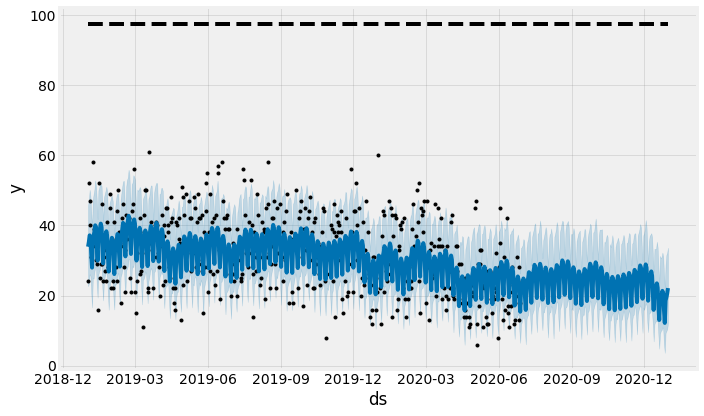

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación AZCAPOTZALCO
MAPE: 0.23450465375543592


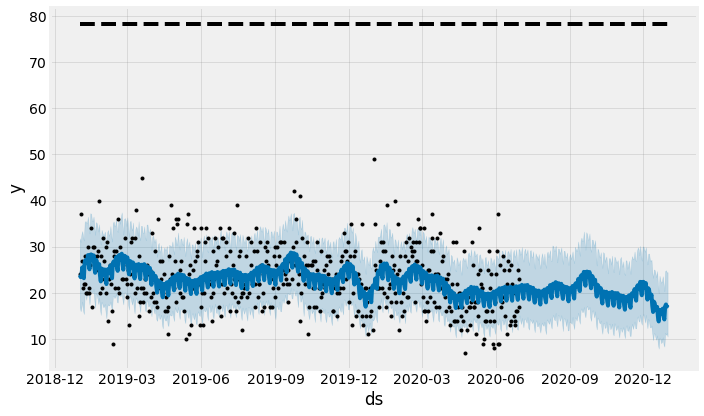

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación BENITO JUAREZ
MAPE: 0.24222157814180703


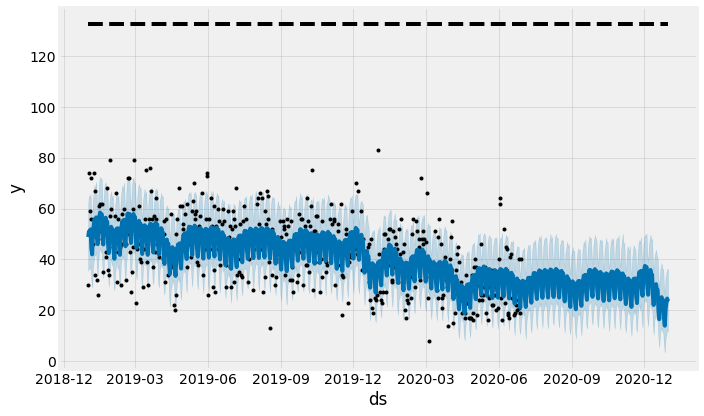

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación COYOACAN
MAPE: 0.24449946213861876


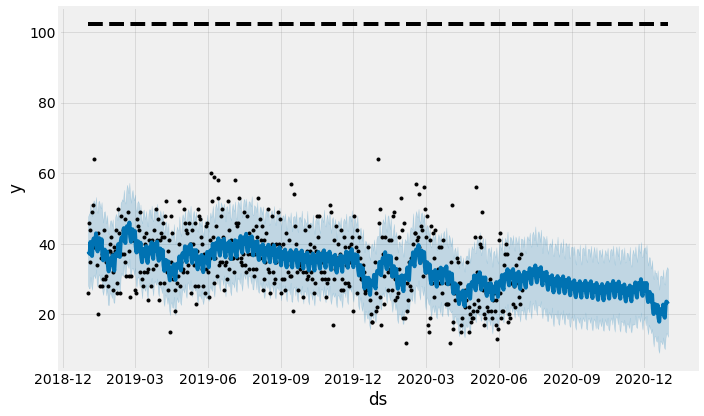

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación CUAUHTEMOC
MAPE: 0.24709330901040322


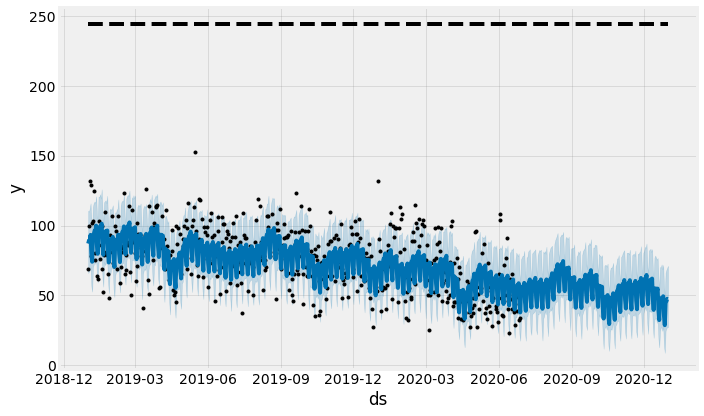

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación LA MAGDALENA CONTRERAS
MAPE: 0.39756309998283856


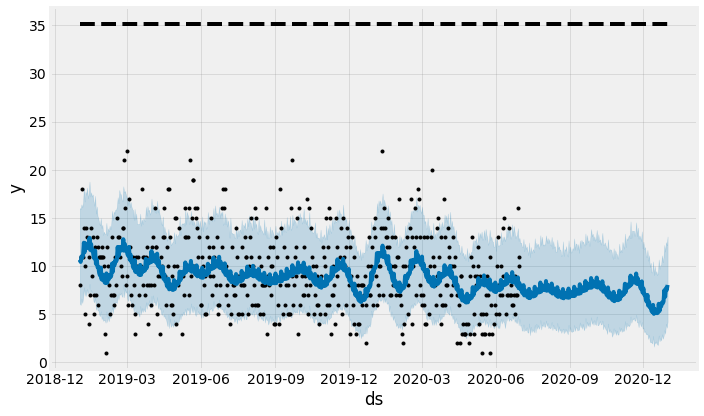

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación IZTAPALAPA
MAPE: 0.19516359220530696


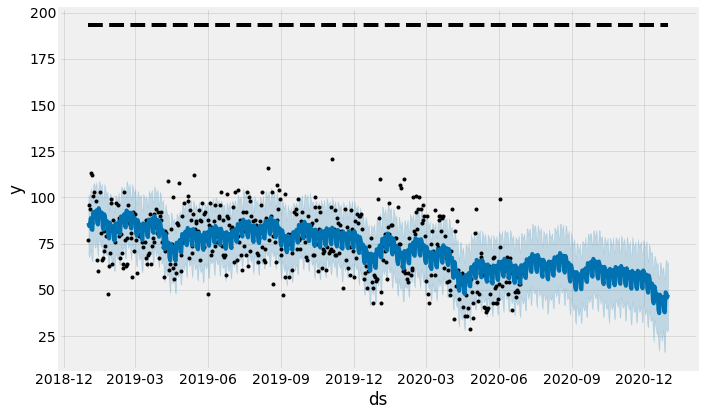

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación IZTACALCO
MAPE: 0.3109282400770475


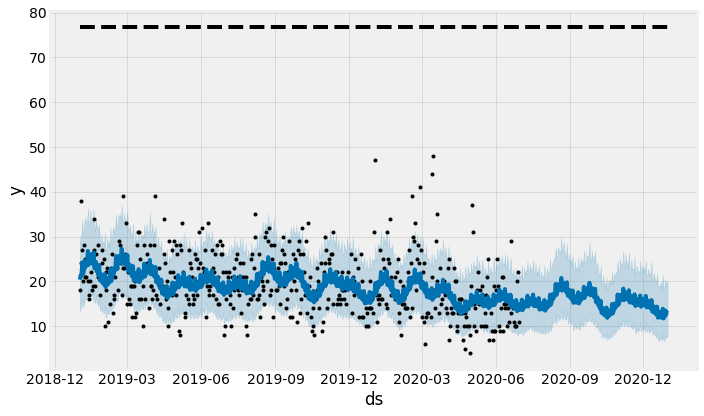

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación XOCHIMILCO
MAPE: 0.34491971202148497


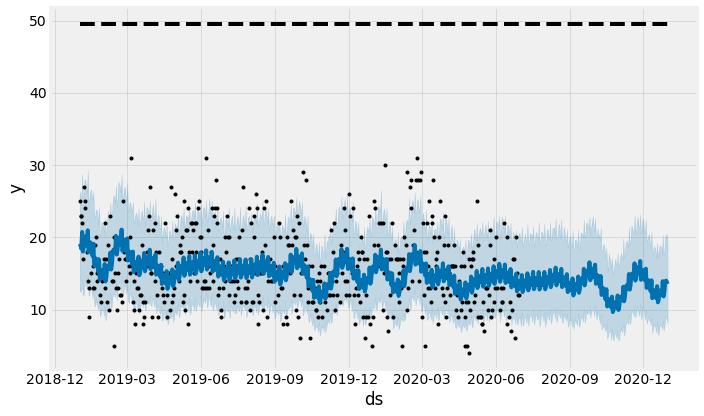

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación TLAHUAC
MAPE: 0.3936920839582857


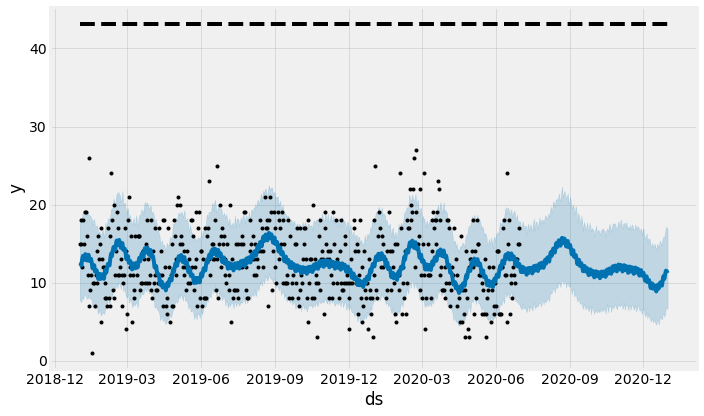

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación MILPA ALTA
MAPE: 0.6832923479111068


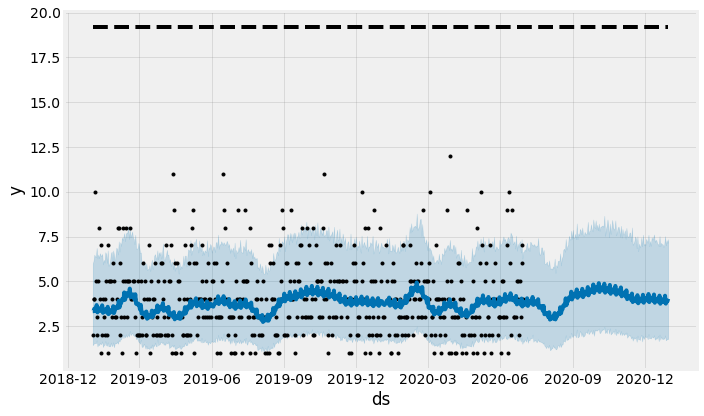

In [21]:
prediction_li, mapes_li = generate_model(li_crimes)


### Crimenes de alto impacto.

Número de crimenes al día por delegación: 


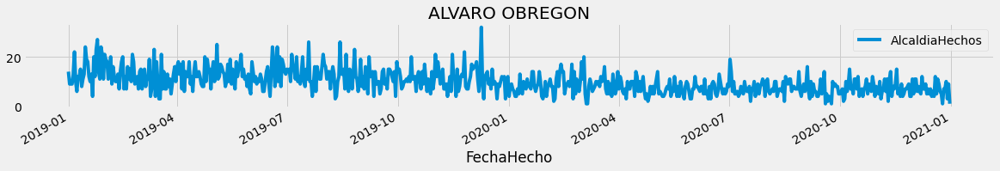

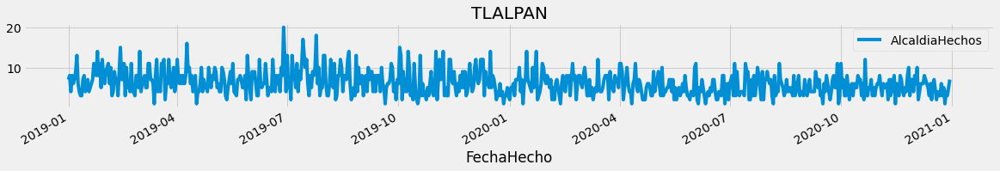

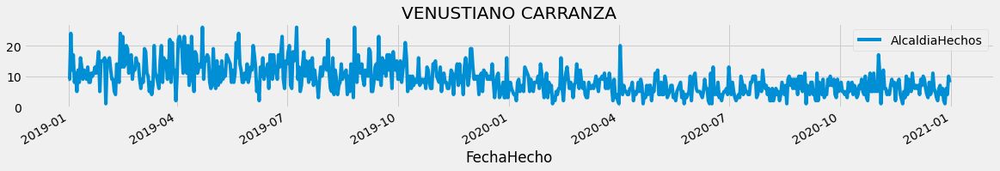

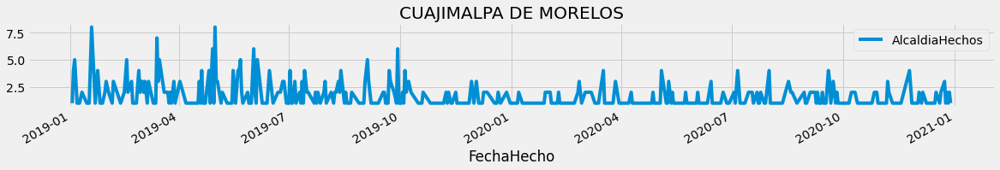

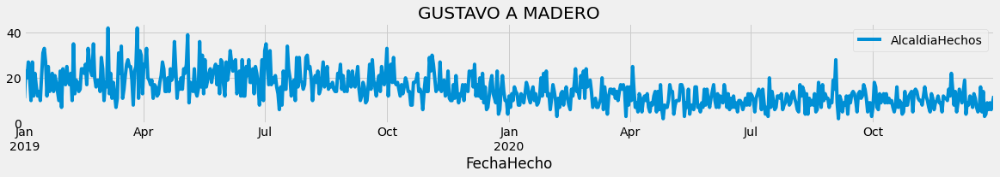

...

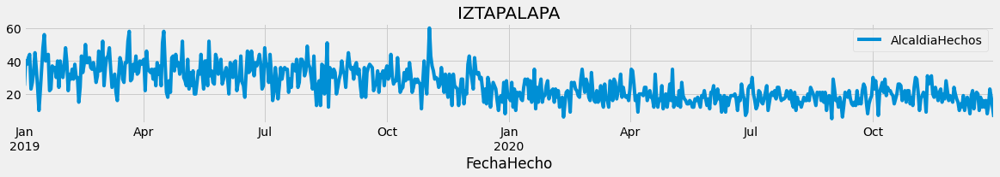

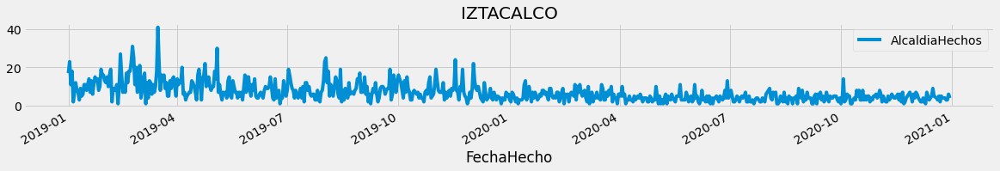

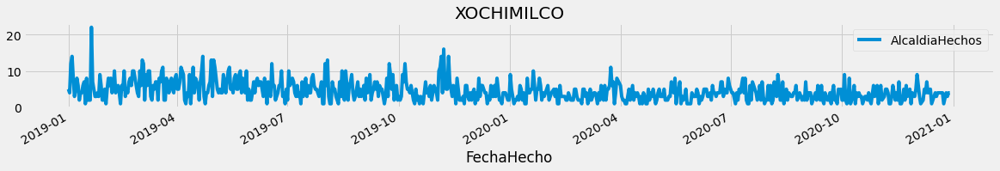

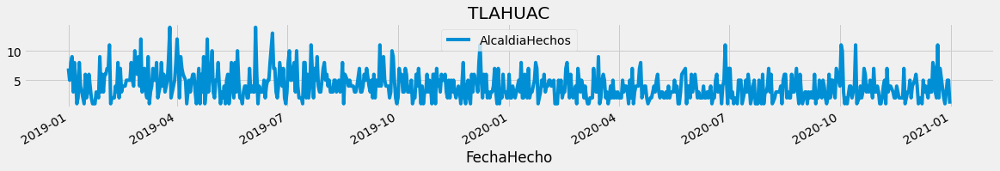

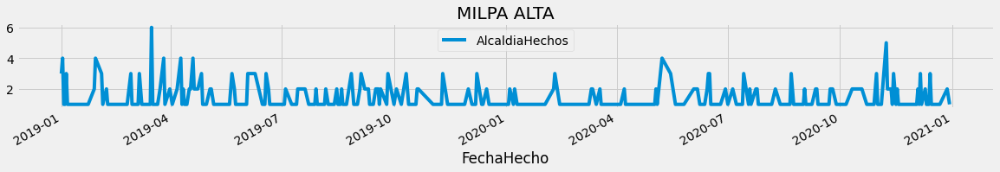

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación ALVARO OBREGON
MAPE: 0.5159216297960463


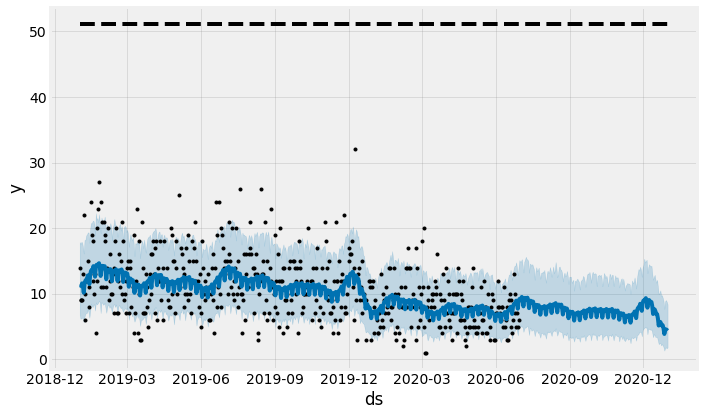

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación TLALPAN
MAPE: 0.5064151719981554


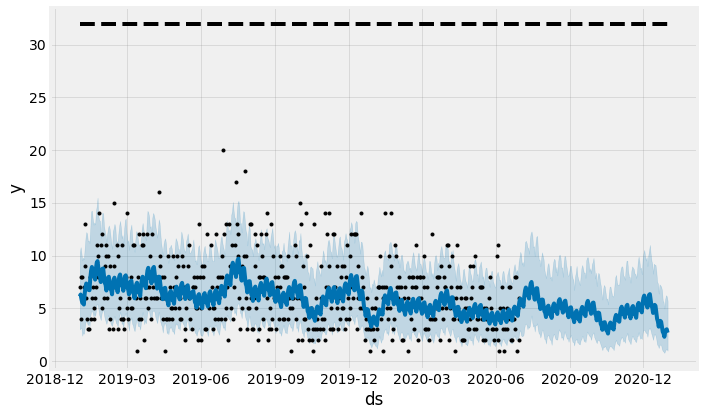

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación VENUSTIANO CARRANZA
MAPE: 0.5382187587524132


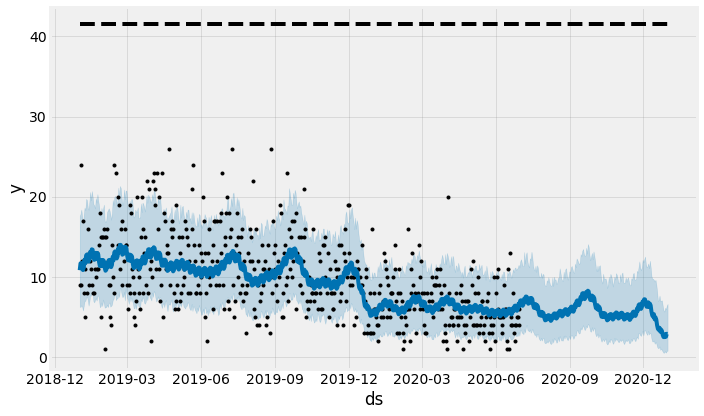

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación CUAJIMALPA DE MORELOS
MAPE: 0.38730091348620654


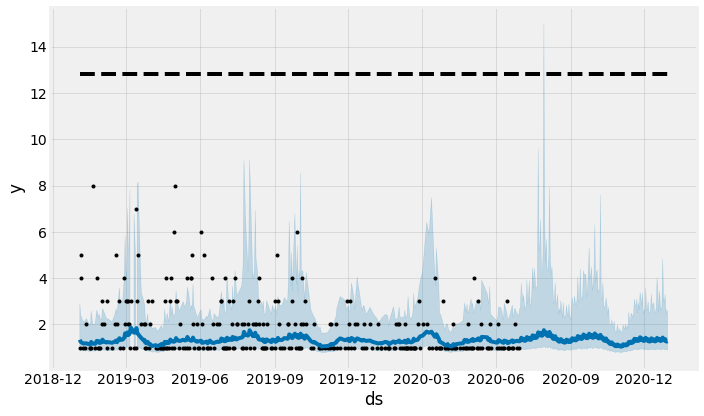

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación GUSTAVO A MADERO
MAPE: 0.3826940323663492


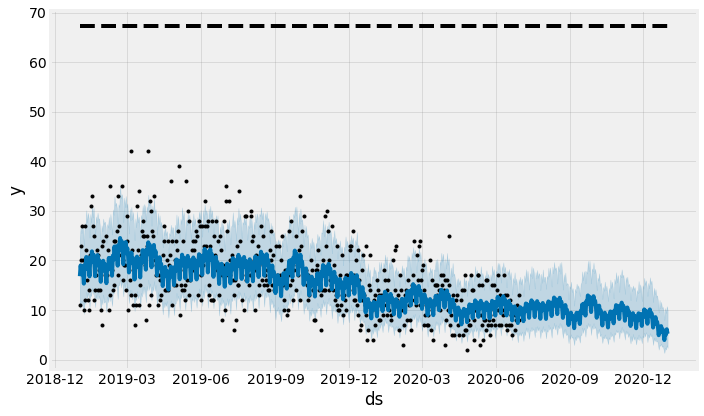

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación MIGUEL HIDALGO
MAPE: 0.582483159236382


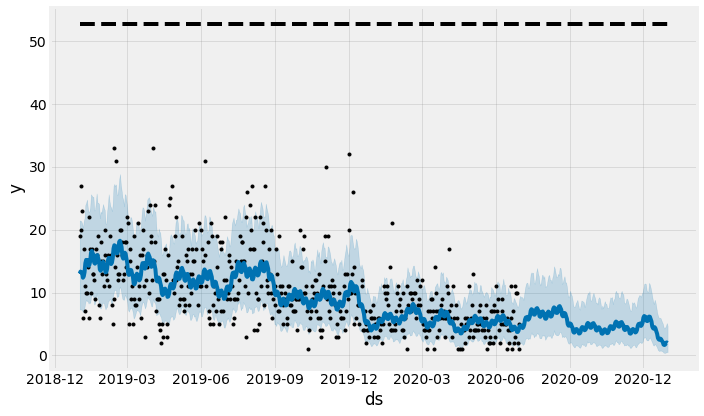

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación AZCAPOTZALCO
MAPE: 0.5940458655384299


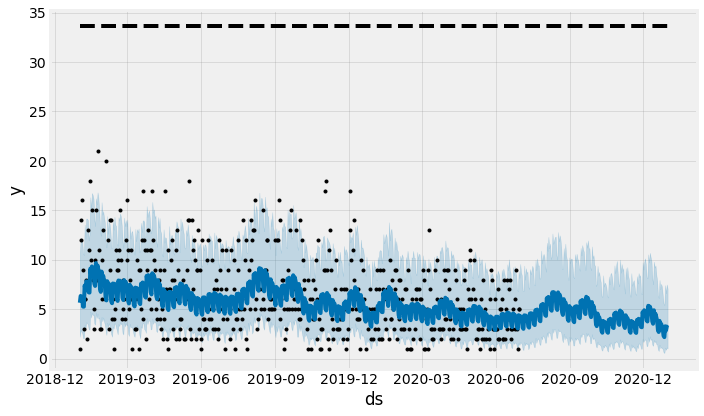

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación BENITO JUAREZ
MAPE: 0.6720213516018771


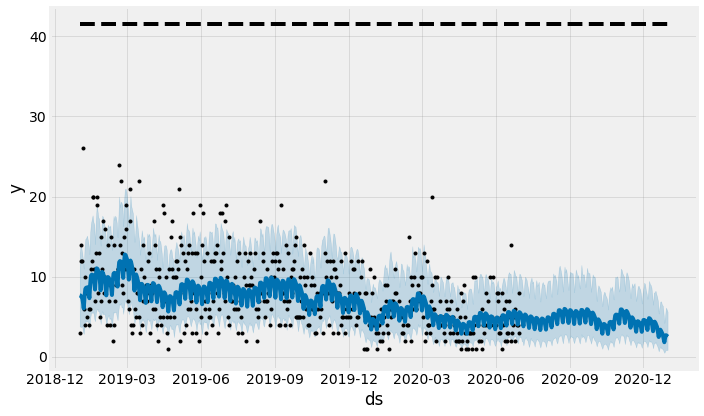

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación COYOACAN
MAPE: 0.6064521969628032


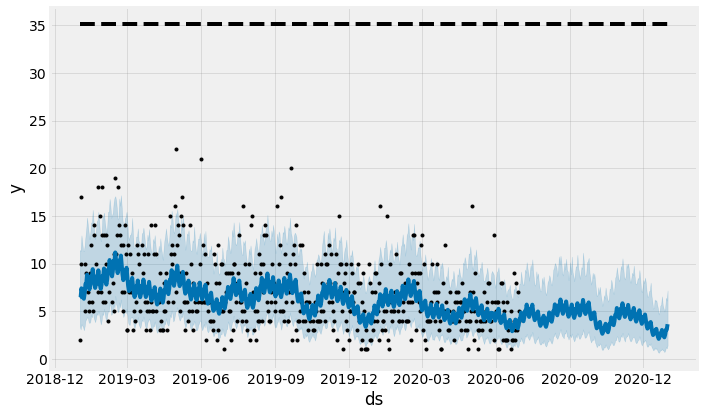

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación CUAUHTEMOC
MAPE: 0.450110303391775


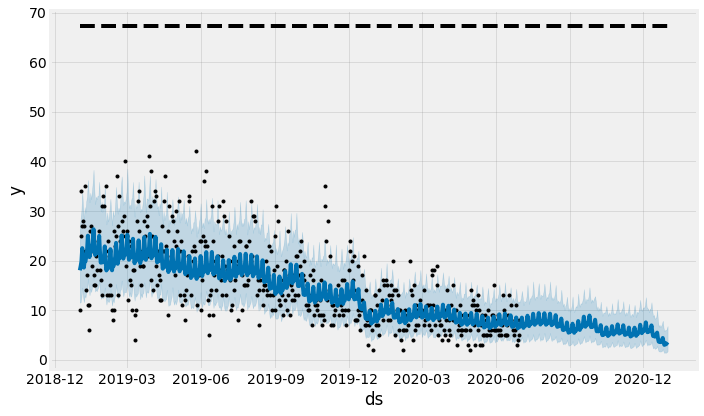

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación LA MAGDALENA CONTRERAS
MAPE: 0.4315879821326372


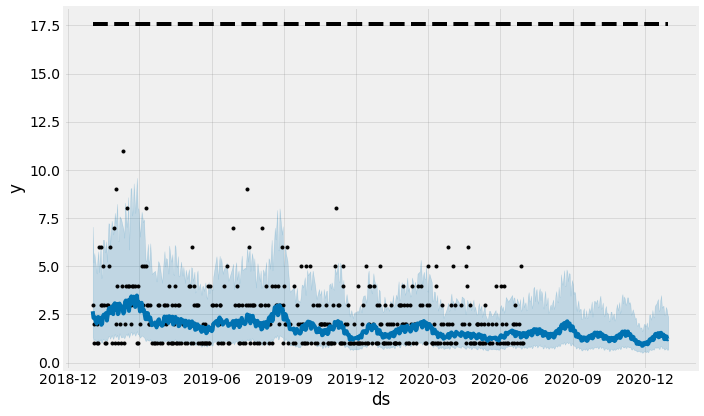

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación IZTAPALAPA
MAPE: 0.27610844778384075


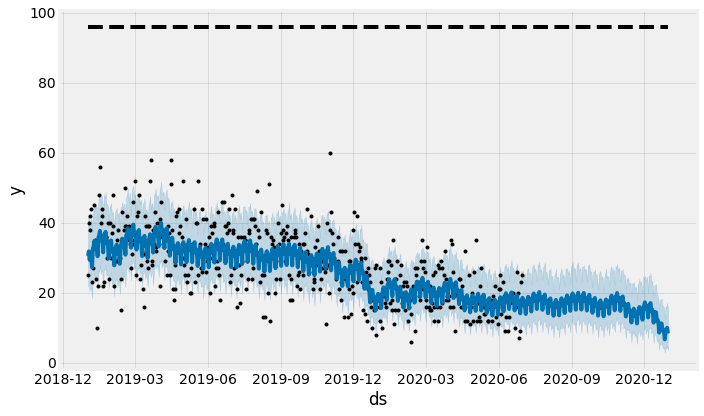

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación IZTACALCO
MAPE: 0.5665834577933857


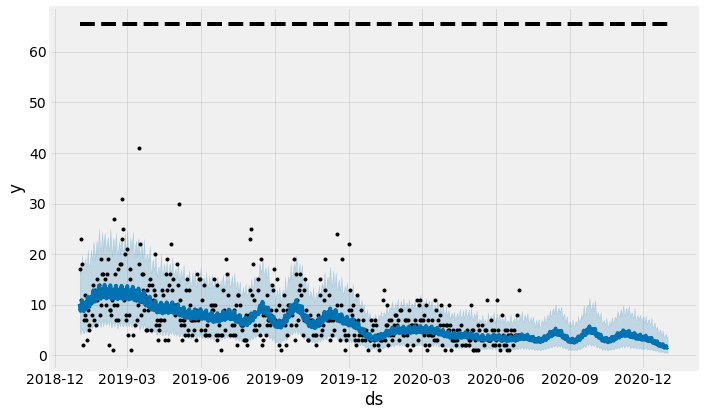

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación XOCHIMILCO
MAPE: 0.7678699592938835


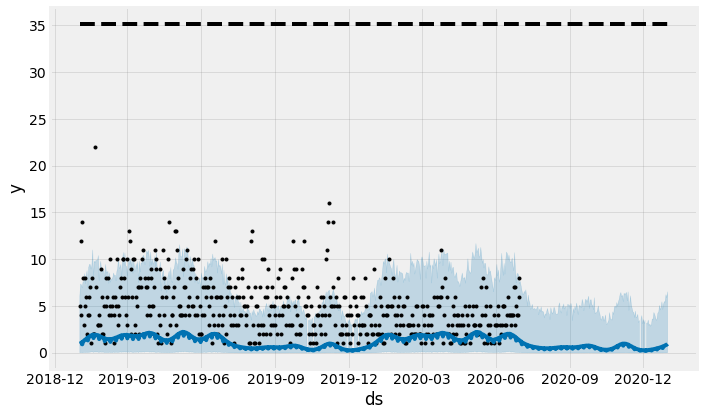

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación TLAHUAC
MAPE: 0.5844914433081904


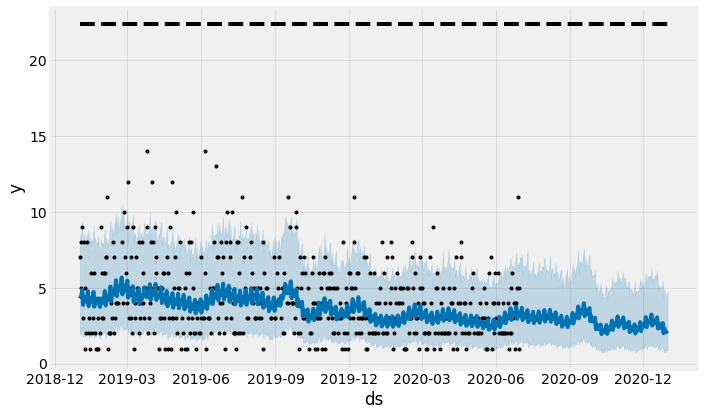

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.




Predicciones para la delegación MILPA ALTA
MAPE: 0.22795200130808724


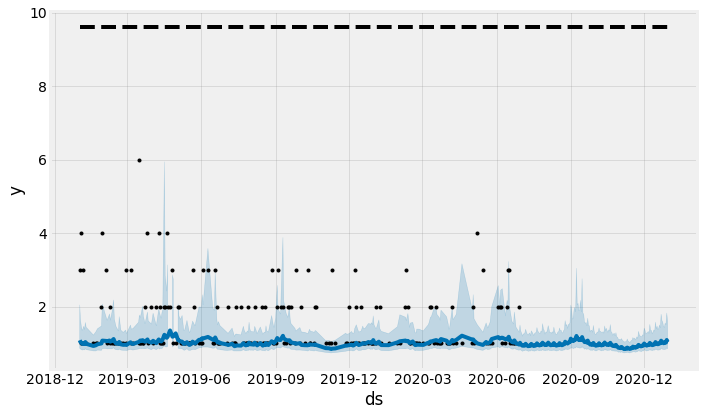

In [22]:
prediction_hi, mapes_hi = generate_model(hi_crimes)

In [23]:
#Promedio de MAPE's
print('MAPE mean of low impact crimes: ',np.array([mapes_li[k] for k in mapes_li]).mean())
print('MAPE min of low impact crimes: ',np.array([mapes_li[k] for k in mapes_li]).min())
print('MAPE max  of low impact crimes: ',np.array([mapes_li[k] for k in mapes_li]).max())
print('\n\nMAPE mean of hi impact crimes: ',np.array([mapes_hi[k] for k in mapes_hi]).mean())
print('MAPE min  of hi impact crimes: ',np.array([mapes_hi[k] for k in mapes_hi]).min())
print('MAPE max  of hi impact crimes: ',np.array([mapes_hi[k] for k in mapes_hi]).max())

MAPE mean of low impact crimes:  0.32226406318088147
MAPE min of low impact crimes:  0.19404249714894928
MAPE max  of low impact crimes:  0.6832923479111068


MAPE mean of hi impact crimes:  0.505641042171904
MAPE min  of hi impact crimes:  0.22795200130808724
MAPE max  of hi impact crimes:  0.7678699592938835


# Conclusiones

#### Crimenes de bajo impacto 
Los modelos tuvieron un rendimiento mejor del esperado, pues debido al tiempo no se realizó un ajuste exhaustivo de los parametros. Para los crimenes de bajo impacto se obtuvo un rendimiento muy bueno, en general alrededor del 30% de error absoluto porcentual e incluso en algunos casos como Iztapalapa y Gustavo Madero el error se encuentra por debajo del 20%. Existen casos como Milpa Alta donde se obtuvo un MAPE de casi el 70%, sin embargo, la muy baja frecuencia de los crimenes en esta zona dificulta un buen desempeño del modelos, esto debido a que al haber una menor frecuencia, existe una mayor variación relativa en los datos.

#### Crimenes de alto impacto
Aqui nuestro modelo encontró más dificultades que en la sección de crimenes de bajo impacto, por la misma razón expuesta anteriormente. A pesar de esto, en Iztapalapa se obtuvo un MAPE del 22% y en promedio el MAPE fue de 50%, más que suficiente para realizar una planeación efectiva de las necesidades que se deben de cubrir para operar eficientemente.

Los modelos presentados tienen un gran margen de mejora, es cuestión de tener un poco más de tiempo para correr un algoritmo que seleccione los modelos optimos variando todo tipo de parametros. Otra de las características que se pueden implementar al Prophet y que en nuestra opinión mejoraría de manera importante el desempeño es añadir información respecto a los días feriados.

#### ¿Para qué sirve esta información?
Los recursos gubernamentales disponibles son siempre limitados, es necesario optimizar la distribución de estos recursos de manera que se cubran todas las necesidades de la población, ya sea en seguridad, salud, transporte, entre otros. Tener una estimación precisa de estas necesidades es la diferencia entre un gobierno con un buen desempeño en cada una de sus secretarías y uno desbalanceado e ineficiente. 
Nunca podremos adivinar el futuro pero si podemos planear inteligentemente para el.


# Extra
Como extra presento los resultados de una optimización mediante el método 'BFGS' donde se buscó el mejor posicionamiento de un número dado de cámaras de vigilancia en la CDMX en relación con la historicidad de los crimenes de alto impacto en la ciudad. Una versión diferente de este código fue realizada (sin el uso de Scipy) en el curso de "Analisis aplicado" con el profesor Miguel Serrato. Solo presento aqui el plot generado.

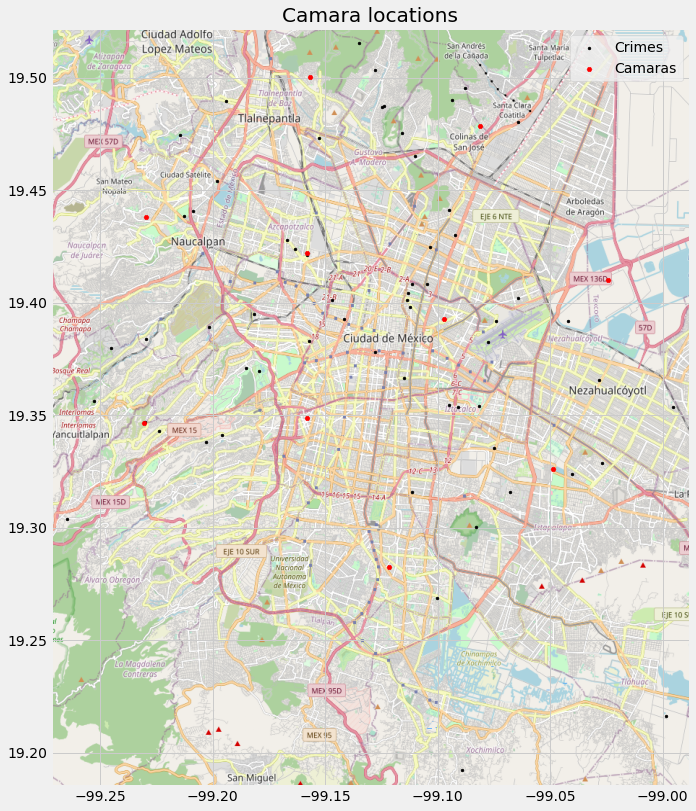

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import optimize
import time
import math


#Leemos la base de datos y la almacenamos en un df.
crime = pd.read_csv("crime_data(2019-2020).csv", index_col = 0)

#Analizamos los diferentes tipos de crimenes.
crime_sample = 400
crime = crime.sample(crime_sample)
crime = crime[crime['Categoria'].isin(hi_crime_list)]
crime = crime[crime['AlcaldiaHechos'].isin(alcs_cdmx)]


#print(crime.head)
crime_geopoints = crime["geopoint"]

#Extracting location data
crime_geopoints = crime_geopoints.str.split(pat=",", n=2, expand=True)
crime_geopoints.columns = ['lon', 'lat']
crime_geopoints = crime_geopoints.astype(float)

#Setup of bounds for plotting
margin  = np.array([-70e-4,70e-4,-70e-4,70e-4])
crime_data = np.array([crime_geopoints.lat, crime_geopoints.lon]).reshape(len(crime_geopoints)*2)
bounds = np.array([crime_geopoints.lat.min(),crime_geopoints.lat.max(),crime_geopoints.lon.min(),crime_geopoints.lon.max()])
bounds += margin
bounds = bounds.round(3)

##Plot solo crimenes
# fig, ax = plt.subplots(figsize = (10,15))
# cdmx = plt.imread('map_cdmx.png')
# ax.scatter(crime_geopoints.lat, crime_geopoints.lon, zorder=1, alpha= 1, c='r', s=3, label = 'Crimes')
# ax.set_title('Crime locations')
# ax.legend()
# ax.set_xlim(bounds[0],bounds[1])
# ax.set_ylim(bounds[2],bounds[3])
# ax.imshow(cdmx, zorder=0, extent = bounds, aspect= 'equal')
# #plt.savefig('crimes.png', dpi = 600)

#Defining number of cams
n_cam = 10
cam_loc = np.array([np.random.uniform(bounds[0],bounds[1],n_cam), np.random.uniform(bounds[2],bounds[3],n_cam)]).reshape(2*n_cam)

#Removing nans
crime_data_aux = crime_data 
crime_data_aux = crime_data_aux[np.logical_not(np.isnan(crime_data_aux))]
cam_loc_aux = cam_loc

def fcosto(camara_loc):
    n1 = n_cam
    n2 = int(len(crime_data_aux)/2)
    costo = 0
    flag = False
    for i in range(n1):
        for j in range(n2):
            costo += math.sqrt((camara_loc[i]-crime_data_aux[j])**2 + (camara_loc[n1+i]-crime_data_aux[n2+j])**2)
        for k in range(n1):
            if i!=k:
                costo += 1/math.sqrt((camara_loc[i]-camara_loc[k])**2+(camara_loc[i+n1]-camara_loc[k+n1])**2)/20
    return costo

#Reshapeamos el array para que pueda leerlo fcosto
crime_data = np.array(crime_geopoints).reshape(2*len(crime_geopoints))

#Optimizamos
optimal_loc = optimize.minimize(fcosto, cam_loc_aux, method = 'BFGS', tol= 10e-2)
optimal_loc = np.array(optimal_loc.x).reshape((2,n_cam))

#Plot de resultados.
fig, ax = plt.subplots(figsize = (14,13))
cdmx = plt.imread('map_cdmx.png')
ax.scatter(crime_geopoints.lat, crime_geopoints.lon, zorder=1, alpha= 1, c='black', s=8, label = 'Crimes')
ax.scatter(optimal_loc[0],optimal_loc[1], zorder = 2, alpha = 1, c = 'red', s = 25, marker = 'H', label = 'Camaras')
ax.set_title('Camara locations')
ax.set_xlim(bounds[0],bounds[1])
ax.set_ylim(bounds[2],bounds[3])
ax.legend()
ax.imshow(cdmx, zorder = 0, extent = bounds, aspect = 'equal')

##Save image
#plt.savefig('Camara locations', dpi = 600)

##Save to CSV
# optimal_loc = pd.DataFrame(optimal_loc.T, columns = ['Latitude', 'Longitude'])
# optimal_loc.to_csv('Optimal camara locations')